<a href="https://colab.research.google.com/github/priyarameshd/EDA/blob/main/EDA1.ipynb" target="_parent"><img src="https://colab.research.google.com/assets/colab-badge.svg" alt="Open In Colab"/></a>

In [ ]:
#load the libraries
import pandas as pd
import numpy as np
import matplotlib.pyplot as plt

The main goal of this assignment is to conduct a thorough exploratory analysis of the "cardiographic.csv" dataset to uncover insights, identify patterns, and understand the dataset's underlying structure. You will use statistical summaries, visualizations, and data manipulation techniques to explore the dataset comprehensively.

In [ ]:
cardio_df = pd.read_csv('/content/Cardiotocographic.csv')

In [ ]:
cardio_df.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 2126 entries, 0 to 2125
Data columns (total 14 columns):
 #   Column    Non-Null Count  Dtype  
---  ------    --------------  -----  
 0   LB        2105 non-null   float64
 1   AC        2106 non-null   float64
 2   FM        2126 non-null   float64
 3   UC        2126 non-null   float64
 4   DL        2126 non-null   float64
 5   DS        2105 non-null   float64
 6   DP        2105 non-null   float64
 7   ASTV      2126 non-null   float64
 8   MSTV      2126 non-null   float64
 9   ALTV      2126 non-null   float64
 10  MLTV      2105 non-null   float64
 11  Width     2105 non-null   float64
 12  Tendency  2105 non-null   float64
 13  NSP       2105 non-null   float64
dtypes: float64(14)
memory usage: 232.7 KB


In [ ]:
cardio_df.shape

(2126, 14)

**1. Dropping the duplicate rows**

Remove all the duplicated values if any from dataset.

In [ ]:
cardio_df.duplicated().sum()

2

In [ ]:
cardio_df_new = cardio_df.drop_duplicates()
cardio_df.shape

(2126, 14)

2.Handle the missing or null values

In [ ]:
cardio_df.isnull().sum()

LB          21
AC          20
FM           0
UC           0
DL           0
DS          21
DP          21
ASTV         0
MSTV         0
ALTV         0
MLTV        21
Width       21
Tendency    21
NSP         21
dtype: int64

<Axes: >

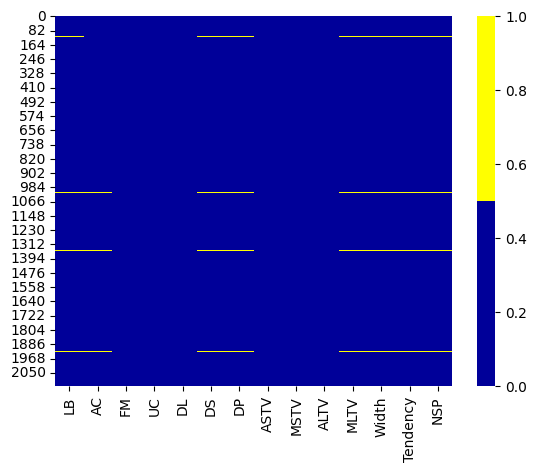

In [ ]:
import seaborn as sns
cols = cardio_df.columns
colours = ['#000099', '#ffff00'] # specify the colours - yellow is missing. blue is not missing.
sns.heatmap(cardio_df[cols].isnull(),
            cmap=sns.color_palette(colours))

In [ ]:
cardio_df[cardio_df.isnull().any(axis=1)].head()

,LB,AC,FM,UC,DL,DS,DP,ASTV,MSTV,ALTV,MLTV,Width,Tendency,NSP
50,NaN,NaN,0.000000,0.008086,0.000000,NaN,NaN,29.0,1.3,0.000000,NaN,NaN,NaN,NaN
116,NaN,0.038567,0.000000,0.006993,0.002331,NaN,NaN,26.0,4.3,0.532872,NaN,NaN,NaN,NaN
126,NaN,NaN,0.000000,0.004380,0.000000,NaN,NaN,69.0,0.3,21.000000,NaN,NaN,NaN,NaN
201,NaN,NaN,0.016393,0.000000,0.000000,NaN,NaN,56.0,0.5,12.000000,NaN,NaN,NaN,NaN
566,NaN,NaN,0.000000,0.004115,0.005487,NaN,NaN,43.0,2.5,0.000000,NaN,NaN,NaN,NaN


Drop the missing values. This is because there is nearly 21 missing value compared to 2126 values this is a small number and this is negligible.

In [ ]:
cardio_df_new = cardio_df.dropna(axis=0)
cardio_df_new.shape

(2105, 14)

In [ ]:
cardio_df_new.isna().sum()

LB          0
AC          0
FM          0
UC          0
DL          0
DS          0
DP          0
ASTV        0
MSTV        0
ALTV        0
MLTV        0
Width       0
Tendency    0
NSP         0
dtype: int64

**Outlier Detection**

An outlier is a point or set of points that are different from other points. Sometimes they can be very high or very low. outliers are one of the primary reasons for resulting in a less accurate model. Hence it's a good to remove them.

<Axes: >

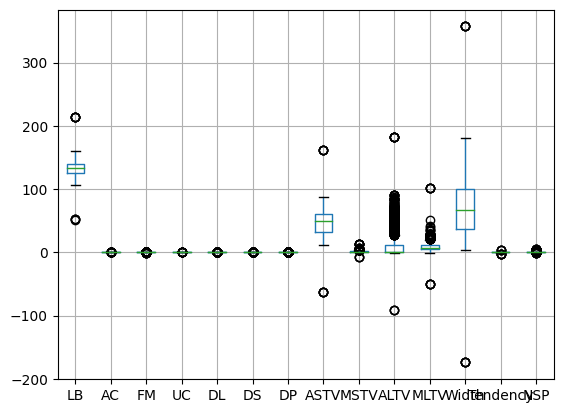

In [ ]:
cardio_df_new.boxplot()

In [ ]:
Q1 = cardio_df_new.quantile(0.25)
Q3 = cardio_df_new.quantile(0.75)
IQR = Q3 - Q1
print(IQR)

LB          14.000000
AC           0.005650
FM           0.002554
UC           0.004698
DL           0.003289
DS           0.000000
DP           0.000000
ASTV        29.000000
MSTV         1.000000
ALTV        11.000000
MLTV         6.300000
Width       63.000000
Tendency     1.000000
NSP          0.000000
dtype: float64


In [ ]:
cardio_df_new = cardio_df_new[~((cardio_df_new < (Q1 - 1.5 * IQR)) |(cardio_df_new > (Q3 + 1.5 * IQR))).any(axis=1)]
cardio_df_new.shape

(885, 14)

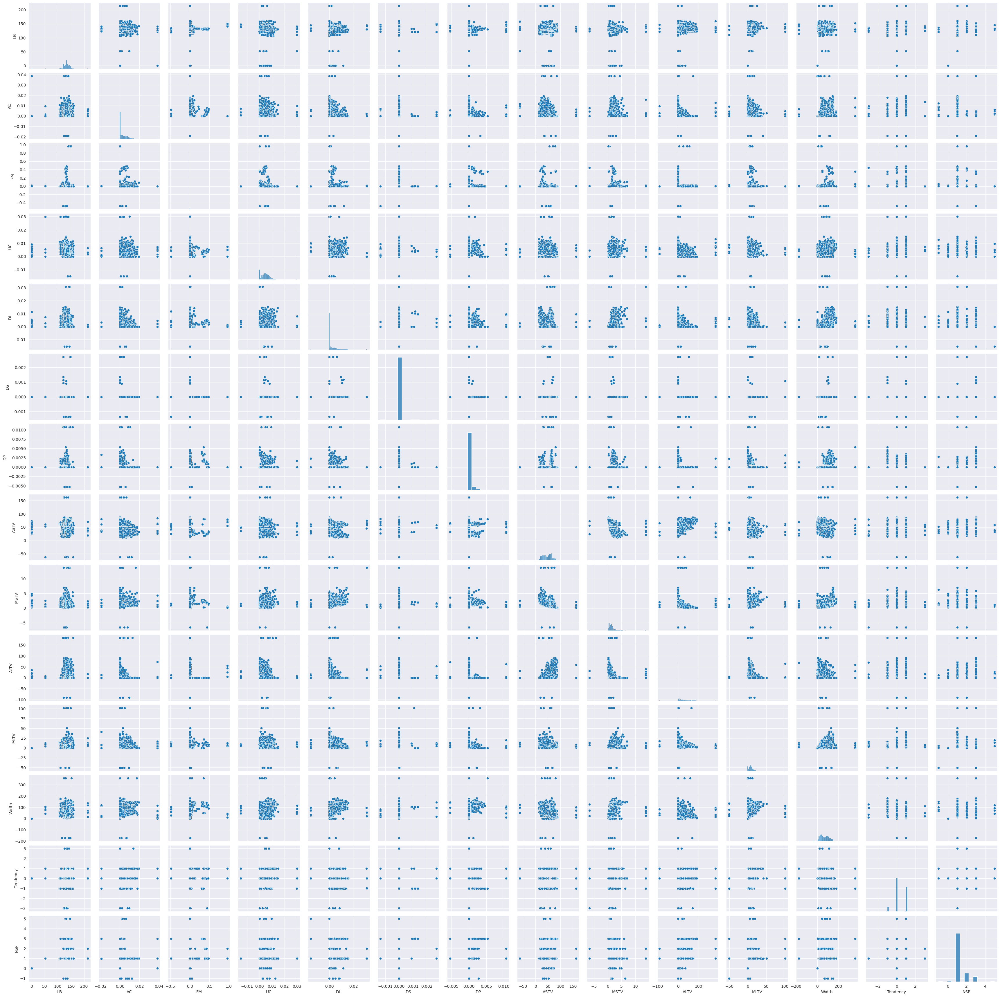

In [ ]:
import seaborn as sns
sns.set_style(style='darkgrid')
sns.pairplot(cardio_df)

Tendency ,NSP and DS can be ignored as there is no variance in data. There is no inear relationship between variables.

In [ ]:
cardio_df = cardio_df.drop(['DS','Tendency', 'NSP'], axis=1)

<function matplotlib.pyplot.show(close=None, block=None)>

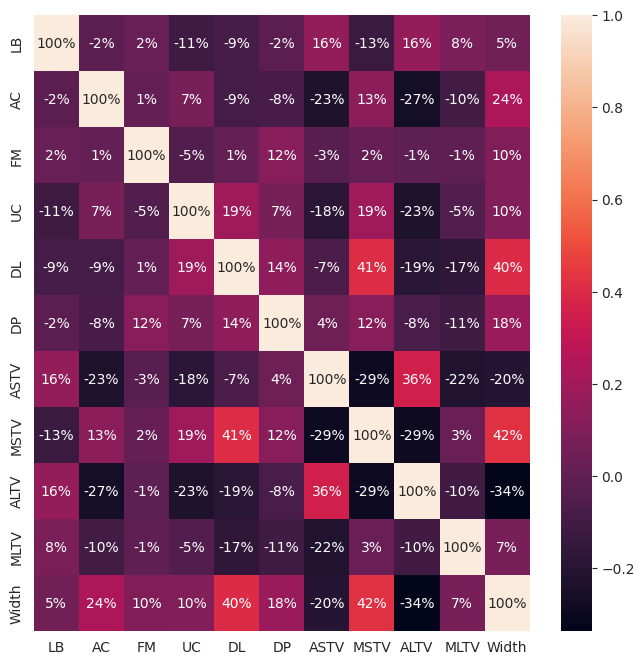

In [ ]:
plt.subplots(figsize=(8,8))
sns.heatmap(cardio_df.corr(), annot = True, fmt = '0.0%')
plt.show

Most of the variables are having negative correlation. Width is positively correlated to MSTV,DL and AC.
ALTV has a strong negative correation with all variables except ASTV and LB.

In [ ]:
cardio_df.describe()

,LB,AC,FM,UC,DL,DP,ASTV,MSTV,ALTV,MLTV,Width
count,2126.000000,2126.000000,2126.000000,2126.000000,2126.000000,2126.000000,2126.000000,2126.000000,2126.000000,2126.000000,2126.000000
mean,132.026470,0.003189,0.009894,0.004391,0.001895,0.000173,46.995984,1.364378,10.285964,8.203052,69.733581
std,17.312967,0.004381,0.067540,0.003340,0.003343,0.000836,18.813973,1.173632,21.205041,7.777652,43.283505
min,0.000000,-0.019284,-0.480634,-0.014925,-0.015393,-0.005348,-63.000000,-6.600000,-91.000000,-50.700000,-174.000000
25%,126.000000,0.000000,0.000000,0.001851,0.000000,0.000000,32.000000,0.700000,0.000000,4.500000,36.000000
50%,133.000000,0.001572,0.000000,0.004484,0.000000,0.000000,49.000000,1.200000,0.000000,7.400000,67.000000
75%,140.000000,0.005606,0.002567,0.006536,0.003289,0.000000,61.000000,1.700000,11.000000,10.800000,100.000000
max,214.000000,0.038567,0.961268,0.030002,0.030769,0.010695,162.000000,13.800000,182.000000,101.400000,357.000000


MSTV,ALTV,MLTV variables are having more outliers.

In [ ]:
cardio_df[cardio_df.isnull().any(axis=1)].head()

,LB,AC,FM,UC,DL,DP,ASTV,MSTV,ALTV,MLTV,Width


<Axes: >

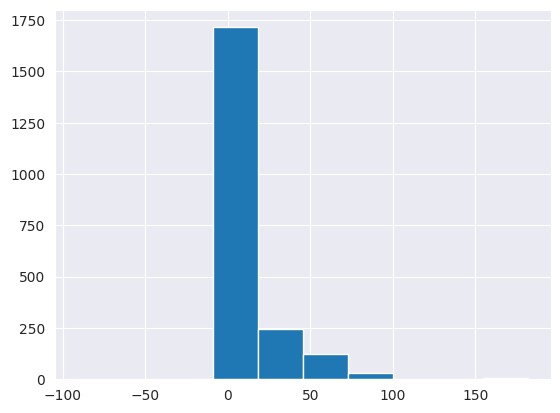

In [ ]:
cardio_df['ALTV'].hist()

In [ ]:
!pip install sweetviz
#pip install markupsafe
import sweetviz as sv
sweet_report = sv.analyze(cardio_df)
sweet_report.show_html('weather_report.html')

     ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 15.1/15.1 MB 49.9 MB/s eta 0:00:00


                                             |          | [  0%]   00:00 -> (? left)

Report weather_report.html was generated! NOTEBOOK/COLAB USERS: the web browser MAY not pop up, regardless, the report IS saved in your notebook/colab files.


In [ ]:
!pip install ydata-profiling

     ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 359.5/359.5 kB 4.7 MB/s eta 0:00:00
     ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 104.8/104.8 kB 12.5 MB/s eta 0:00:00
  Preparing metadata (setup.py) ... done
     ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 686.1/686.1 kB 28.6 MB/s eta 0:00:00
     ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 296.5/296.5 kB 2.8 MB/s eta 0:00:00
  Created wheel for htmlmin: filename=htmlmin-0.1.12-py3-none-any.whl size=27080 sha256=6912ac50535d400c1e770a07cf5e70a6427f92194c0f85ee35444df42ec16a93
  Stored in directory: /root/.cache/pip/wheels/dd/91/29/a79cecb328d01739e64017b6fb9a1ab9d8cb1853098ec5966d
Successfully built htmlmin


In [ ]:
!pip install typing-extensions --upgrade
from ydata_profiling import ProfileReport

In [ ]:

import pandas as pd
data1 = pd.read_csv("/content/Cardiotocographic.csv")
EDA_report=ProfileReport(data1)
EDA_report.to_file(output_file='report.html')
EDA_report

/usr/local/lib/python3.10/dist-packages/ydata_profiling/profile_report.py:363: UserWarning: Try running command: 'pip install --upgrade Pillow' to avoid ValueError
  warnings.warn(


Summarize dataset:   0%|          | 0/5 [00:00<?, ?it/s]

Generate report structure:   0%|          | 0/1 [00:00<?, ?it/s]

Render HTML:   0%|          | 0/1 [00:00<?, ?it/s]

Export report to file:   0%|          | 0/1 [00:00<?, ?it/s]